In [ ]:
  import os
# Path to the zip file in Google Drive
zip_path = '/content/drive/MyDrive/path/PotholeDetection.zip'

In [ ]:
import zipfile

# Destination directory to unzip the files
extract_dir = '/content/path/PotholeDetection'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# List files to verify
for root, dirs, files in os.walk(extract_dir):
    for file in files:
        print(os.path.join(root, file))

/content/path/PotholeDetection/README.roboflow.txt
/content/path/PotholeDetection/README.dataset.txt
/content/path/PotholeDetection/data.yaml
/content/path/PotholeDetection/test/labels/img-244_jpg.rf.1e0637bc48b908c81c25fca45c1af35c.txt
/content/path/PotholeDetection/test/labels/159_png_jpg.rf.fabcfa7b3de0b97892e32ee397affd57.txt
/content/path/PotholeDetection/test/labels/418_png_jpg.rf.4b94e4e0bf15b362f8b0993e5e52daf4.txt
/content/path/PotholeDetection/test/labels/205_png_jpg.rf.002ef030070b2599a5daaa29890f5b02.txt
/content/path/PotholeDetection/test/labels/img-520_jpg.rf.de05298b5f9841a16941ad50828eeb5b.txt
/content/path/PotholeDetection/test/labels/img-20_jpg.rf.e1e84982abc868fe9c59533c9b4f7716.txt
/content/path/PotholeDetection/test/labels/img-515_jpg.rf.bbab8ed11c1708e12e91c6d7d98de61a.txt
/content/path/PotholeDetection/test/labels/img-597_jpg.rf.f300e44270e3eb1b625b367eff24c0bd.txt
/content/path/PotholeDetection/test/labels/788_png_jpg.rf.19c87be2cb22b4627a8d53f9895f9545.txt
/con

In [ ]:
!pip install ultralytics
!pip install -U ipywidgets
!pip install wandb


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.1/800.1 kB 10.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 35.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.4 MB/s eta 0:00:00


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

In [ ]:
train_img_dir = '/content/path/PotholeDetection/train/images'
train_images = os.listdir(train_img_dir)

val_img_dir = '/content/path/PotholeDetection/valid/images'
val_images = os.listdir(val_img_dir)

train_labels_dir = '/content/path/PotholeDetection/train/labels'
val_labels_dir = '/content/path/PotholeDetection/valid/labels'

In [ ]:
label_list = ['pothole']

In [ ]:
def label_name(label_class):
    if 0 <= label_class < len(label_list):
        return label_list[label_class]
    else:
        return "none"

def load_labels(images, labels_dir):
    labels = []
    for img in images:
        label_path = os.path.join(labels_dir, img.replace('.jpg', '.txt'))
        try:
            with open(label_path, "r") as file:
                text = file.read().strip()
            if len(text) < 1:
                labels.append('None')
            else:
                labels.append(int(text.split()[0]))
        except FileNotFoundError:
            labels.append('None')
    return labels

train_labels = load_labels(train_images, train_labels_dir)
val_labels = load_labels(val_images, val_labels_dir)

def convert_labels(labels):
    return [int(label) if label != 'None' else -1 for label in labels]

train_labels = convert_labels(train_labels)
val_labels = convert_labels(val_labels)

In [ ]:
df_train = pd.DataFrame({
    'image_path': train_images,
    'label_class': train_labels
})
df_train['label_name'] = df_train['label_class'].apply(label_name)

df_val = pd.DataFrame({
    'image_path': val_images,
    'label_class': val_labels
})
df_val['label_name'] = df_val['label_class'].apply(label_name)


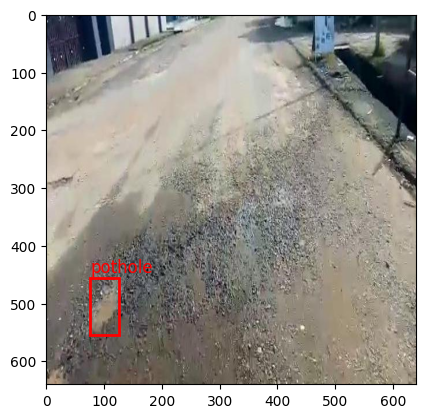

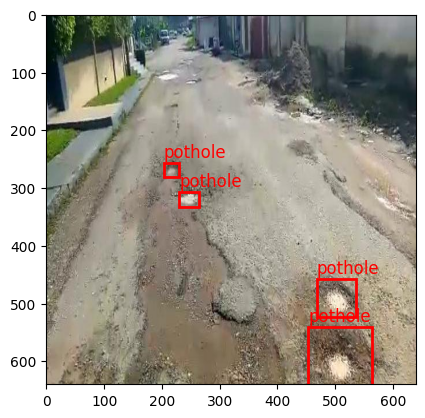

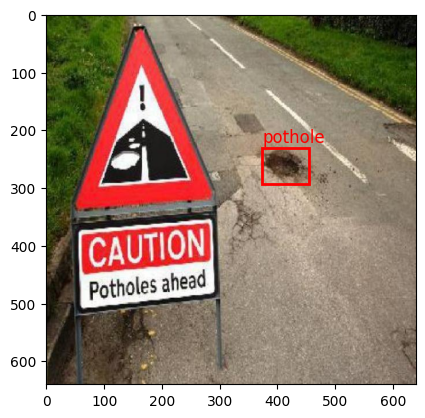

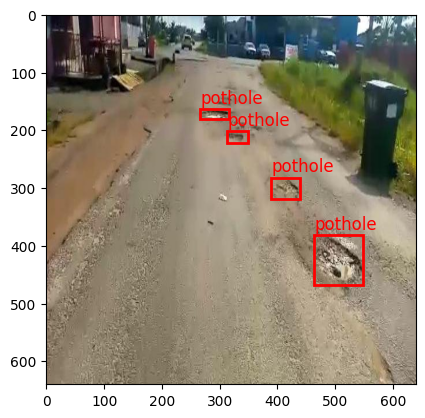

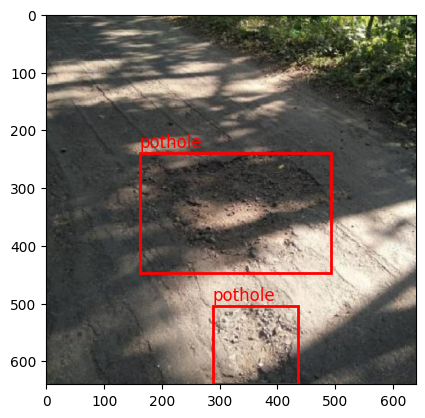

In [ ]:

import matplotlib.patches as patches

def plot_bounding_box(image_path, labels_dir):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label_path = os.path.join(labels_dir, os.path.basename(image_path).replace('.jpg', '.txt'))
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    try:
        with open(label_path, 'r') as file:
            for line in file:
                class_id, x_center, y_center, width, height = map(float, line.split())
                x_center, y_center, width, height = x_center * img.shape[1], y_center * img.shape[0], width * img.shape[1], height * img.shape[0]
                rect = patches.Rectangle((x_center - width / 2, y_center - height / 2), width, height, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                plt.text(x_center - width / 2, y_center - height / 2 - 10, label_name(int(class_id)), color='r', fontsize=12)
    except FileNotFoundError:
        print(f"Label file not found for {image_path}")
    plt.show()


for img_path in df_train['image_path'].sample(5).values:
    plot_bounding_box(os.path.join(train_img_dir, img_path), train_labels_dir)

In [ ]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def _init_(self, kernel_size=7):
        super(SpatialAttention, self)._init_()
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=(kernel_size - 1) // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

In [ ]:
import torch
import torch.nn as nn
from ultralytics import YOLO

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class YOLOv9WithAttention(nn.Module):
    def __init__(self, yolo_model):
        super(YOLOv9WithAttention, self).__init__()
        self.backbone = yolo_model.model.model[0]
        self.neck = yolo_model.model.model[1]
        self.head = yolo_model.model.model[2]
        self.spatial_attention = SpatialAttention(kernel_size=7)

    def forward(self, x):
        x = self.backbone(x)
        x = self.spatial_attention(x) * x
        x = self.neck(x)
        x = self.head(x)
        return x

# Load the pre-trained YOLOv9 model
yolo_model = YOLO("yolov9c.pt")

# Integrate the spatial attention module
model_with_attention = YOLOv9WithAttention(yolo_model)
import torch
import torch.nn as nn
from ultralytics import YOLO

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class YOLOv9WithAttention(nn.Module):
    def __init__(self, yolo_model):
        super(YOLOv9WithAttention, self).__init__()
        self.backbone = yolo_model.model.model[0]
        self.neck = yolo_model.model.model[1]
        self.head = yolo_model.model.model[2]
        self.spatial_attention = SpatialAttention(kernel_size=7)

    def forward(self, x):
        x = self.backbone(x)
        x = self.spatial_attention(x) * x
        x = self.neck(x)
        x = self.head(x)
        return x

# Load the pre-trained YOLOv9 model
yolo_model = YOLO("yolov9c.pt")

# Integrate the spatial attention module
model_with_attention = YOLOv9WithAttention(yolo_model)


100%|██████████| 49.4M/49.4M [00:00<00:00, 278MB/s]


In [ ]:
model = YOLO("/content/yolov9c.pt")

#wandb.login(key="61a11588a7dfdbf3b5d9121ce4a63f9df789546e")

model.train(data="/content/path/PotholeDetection/data.yaml", epochs=20, imgsz=512, lr0=0.001, dropout=0.2)


Ultralytics YOLOv8.2.54 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolov9c.pt, data=/content/path/PotholeDetection/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

100%|██████████| 755k/755k [00:00<00:00, 41.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytics

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.25M/6.25M [00:00<00:00, 172MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/path/PotholeDetection/train/labels... 943 images, 0 backgrounds, 0 corrupt: 100%|██████████| 943/943 [00:01<00:00, 569.48it/s]


train: New cache created: /content/path/PotholeDetection/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/path/PotholeDetection/valid/labels... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<00:00, 422.95it/s]

val: New cache created: /content/path/PotholeDetection/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.65G      1.751      2.151      1.603         70        512: 100%|██████████| 59/59 [00:37<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]

                   all        269        988    0.00577      0.424    0.00407    0.00168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.51G      1.796      1.627      1.639         67        512: 100%|██████████| 59/59 [00:32<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]

                   all        269        988     0.0273      0.577     0.0217    0.00924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.48G      1.773      1.604      1.586         96        512: 100%|██████████| 59/59 [00:30<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]

                   all        269        988      0.267      0.201      0.136     0.0531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.57G      1.677      1.467      1.544        116        512: 100%|██████████| 59/59 [00:31<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.44it/s]

                   all        269        988      0.652      0.493      0.548      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.47G      1.673      1.439      1.551        108        512: 100%|██████████| 59/59 [00:31<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.63it/s]

                   all        269        988      0.621      0.541      0.573      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.42G      1.609      1.372      1.486         85        512: 100%|██████████| 59/59 [00:31<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]

                   all        269        988      0.661      0.595      0.631      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.43G      1.564      1.309      1.461         79        512: 100%|██████████| 59/59 [00:32<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        269        988      0.664      0.539      0.608      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.43G      1.538      1.244       1.45         60        512: 100%|██████████| 59/59 [00:31<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.77it/s]

                   all        269        988      0.712      0.684       0.74      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.48G      1.516      1.183      1.428        123        512: 100%|██████████| 59/59 [00:31<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]

                   all        269        988      0.685      0.615      0.693      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20       7.5G      1.513      1.164      1.419         51        512: 100%|██████████| 59/59 [00:32<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.69it/s]

                   all        269        988      0.772      0.734       0.81      0.462


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      7.44G      1.464      1.102      1.407         60        512: 100%|██████████| 59/59 [00:36<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]

                   all        269        988      0.764      0.806       0.84      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.52G      1.437      1.053      1.407         33        512: 100%|██████████| 59/59 [00:32<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.19it/s]

                   all        269        988      0.768      0.717        0.8      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      7.46G      1.409      1.022      1.377         89        512: 100%|██████████| 59/59 [00:32<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]

                   all        269        988      0.811      0.733      0.829      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.42G      1.383     0.9883      1.367         59        512: 100%|██████████| 59/59 [00:32<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]

                   all        269        988       0.81      0.769      0.832      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      7.43G      1.347     0.9456      1.338         55        512: 100%|██████████| 59/59 [00:31<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.64it/s]

                   all        269        988      0.785      0.793      0.849      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      7.47G      1.321     0.8851      1.322         62        512: 100%|██████████| 59/59 [00:31<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]

                   all        269        988      0.813      0.783      0.858       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      7.37G      1.314     0.8536      1.316         48        512: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.67it/s]

                   all        269        988        0.8      0.798      0.858      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      7.53G      1.282     0.8206       1.29         46        512: 100%|██████████| 59/59 [00:31<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.64it/s]

                   all        269        988      0.803      0.815      0.874      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      7.42G      1.248     0.7957      1.282         43        512: 100%|██████████| 59/59 [00:31<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]

                   all        269        988      0.836      0.814       0.88      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      7.53G       1.23     0.7617      1.265         55        512: 100%|██████████| 59/59 [00:31<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.69it/s]

                   all        269        988      0.857      0.805       0.89      0.552



20 epochs completed in 0.230 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 51.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.54 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25320019 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all        269        988      0.856      0.805      0.889      0.552
Speed: 0.7ms preprocess, 11.1ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg1,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg2,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
metrics/mAP50(B),▁▁▂▅▅▆▆▇▆▇█▇████████
metrics/mAP50-95(B),▁▁▂▄▄▅▅▆▆▇▇▇▇▇▇█████
metrics/precision(B),▁▁▃▆▆▆▆▇▇▇▇▇██▇█████
metrics/recall(B),▄▅▁▄▅▅▅▇▆▇█▇▇▇██████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▅▅▅▅▄▄▃▃▂▂▂▂▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e591dc99030>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
trained_weights = "/content/runs/detect/train/weights/best.pt"
model = YOLO(trained_weights)

# Evaluate the model on the validation set
results = model.val(data = '/content/path/PotholeDetection/data.yaml')

# Print the evaluation metrics
# Accessing metrics using the appropriate methods
precision = results.box.mp # Mean precision
recall = results.box.mr    # Mean recall
mAP50 = results.box.map50  # mAP@0.5
mAP50_95 = results.box.map  # mAP@0.5:0.95

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"mAP@0.5: {mAP50}")
print(f"mAP@0.5:0.95: {mAP50_95}")


Ultralytics YOLOv8.2.54 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25320019 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/path/PotholeDetection/valid/labels.cache... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.43it/s]


                   all        269        988       0.86      0.804       0.89      0.552
Speed: 0.4ms preprocess, 21.4ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/val
Precision: 0.8602540244168622
Recall: 0.8037485895236616
mAP@0.5: 0.8899101357684223
mAP@0.5:0.95: 0.5523345060572618


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

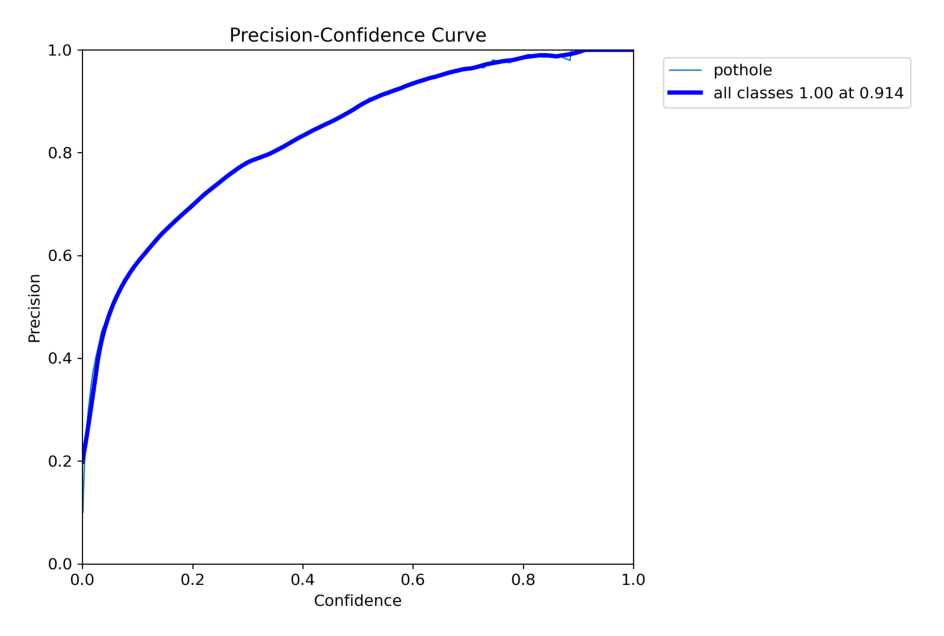

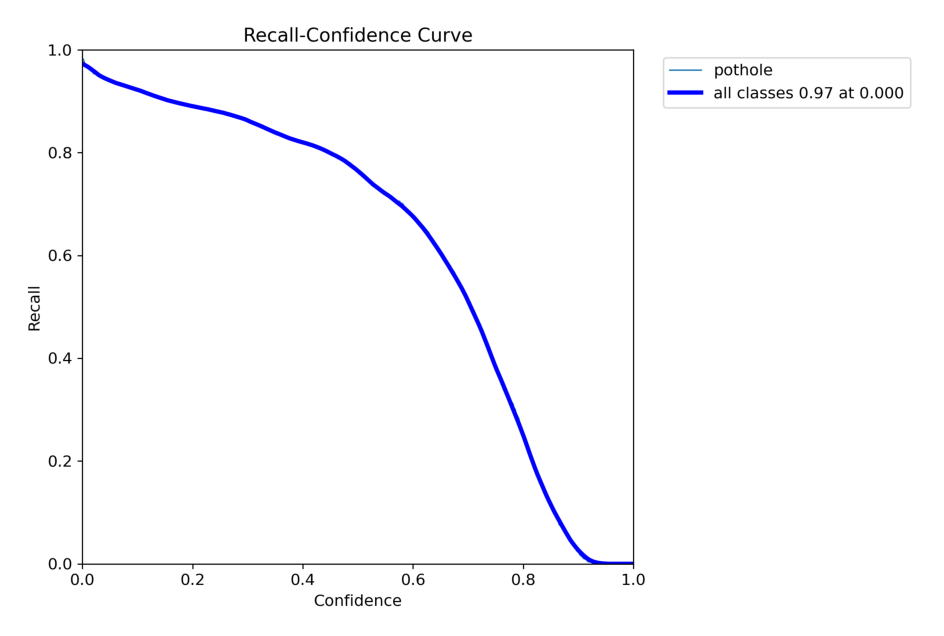

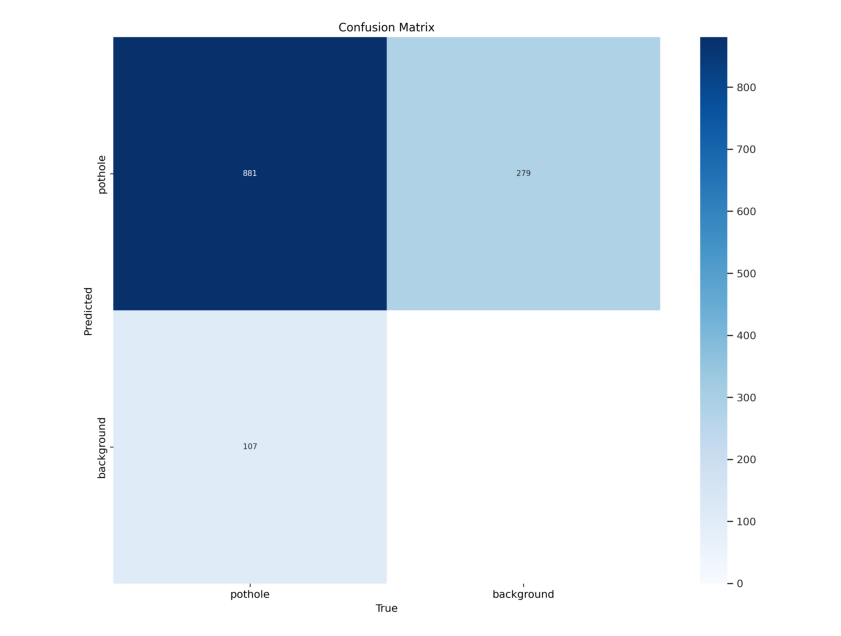

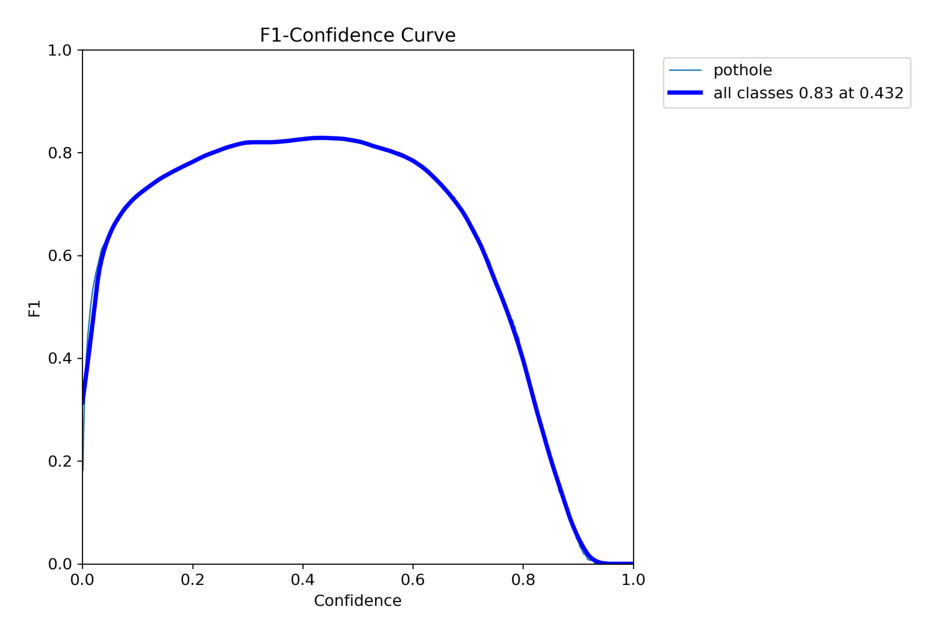

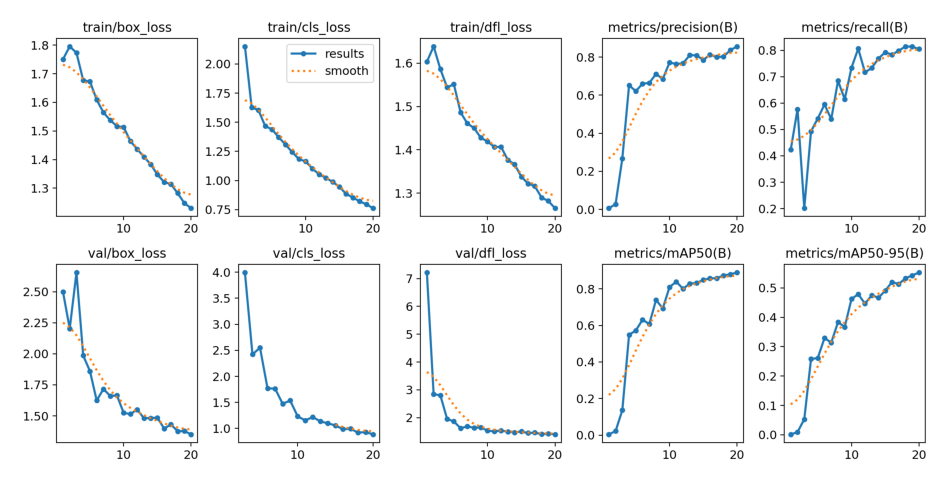

In [ ]:
list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png", "F1_curve.png", "results.png"]

for metric in list_of_metrics:
    image = Image.open(f'/content/runs/detect/train/{metric}')
    plt.figure(figsize=(12, 8))
    plt.axis("off")
    plt.imshow(image)
    plt.show()


In [ ]:
trained_weights = "/content/runs/detect/train/weights/best.pt"
model = YOLO(trained_weights)

In [ ]:
def test_visualization(images):
    output = model.predict(images)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(images):
        ax = axes[i // 3, i % 3]
        im_bgr = cv2.imread(r)
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(output):
        ax = axes[i // 3, i % 3]
        im_bgr = r.plot()  # BGR-order numpy array
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)



0: 512x512 2 potholes, 23.2ms
1: 512x512 4 potholes, 23.2ms
2: 512x512 2 potholes, 23.2ms
3: 512x512 6 potholes, 23.2ms
4: 512x512 3 potholes, 23.2ms
5: 512x512 3 potholes, 23.2ms
6: 512x512 2 potholes, 23.2ms
7: 512x512 3 potholes, 23.2ms
8: 512x512 11 potholes, 23.2ms
Speed: 2.7ms preprocess, 23.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


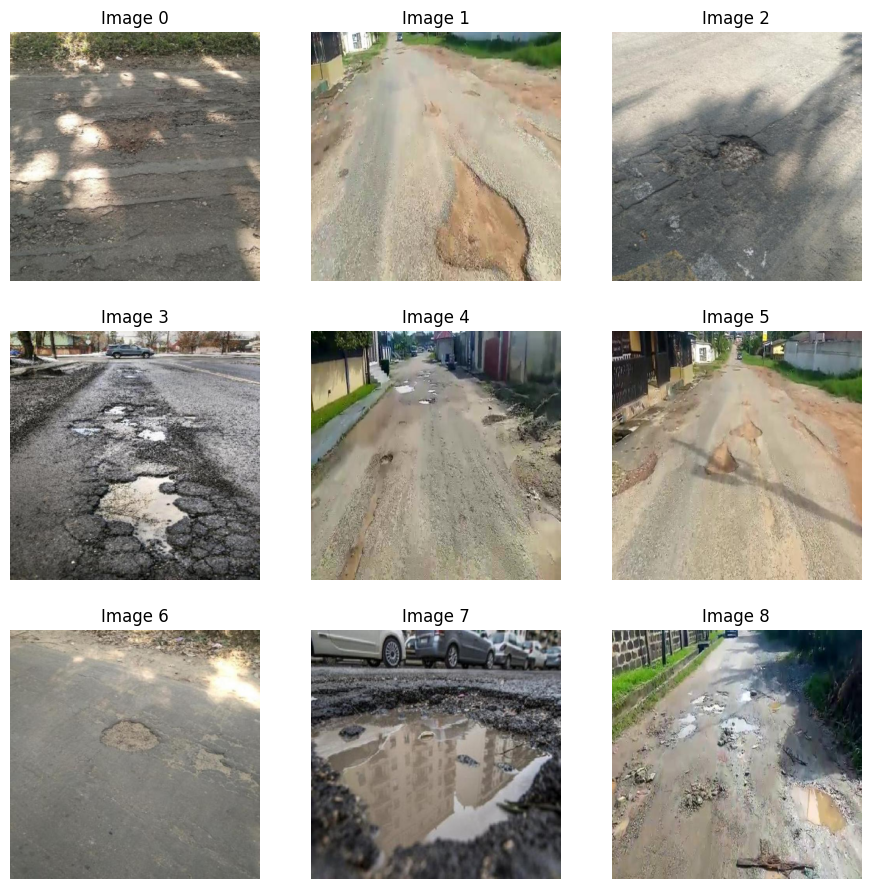

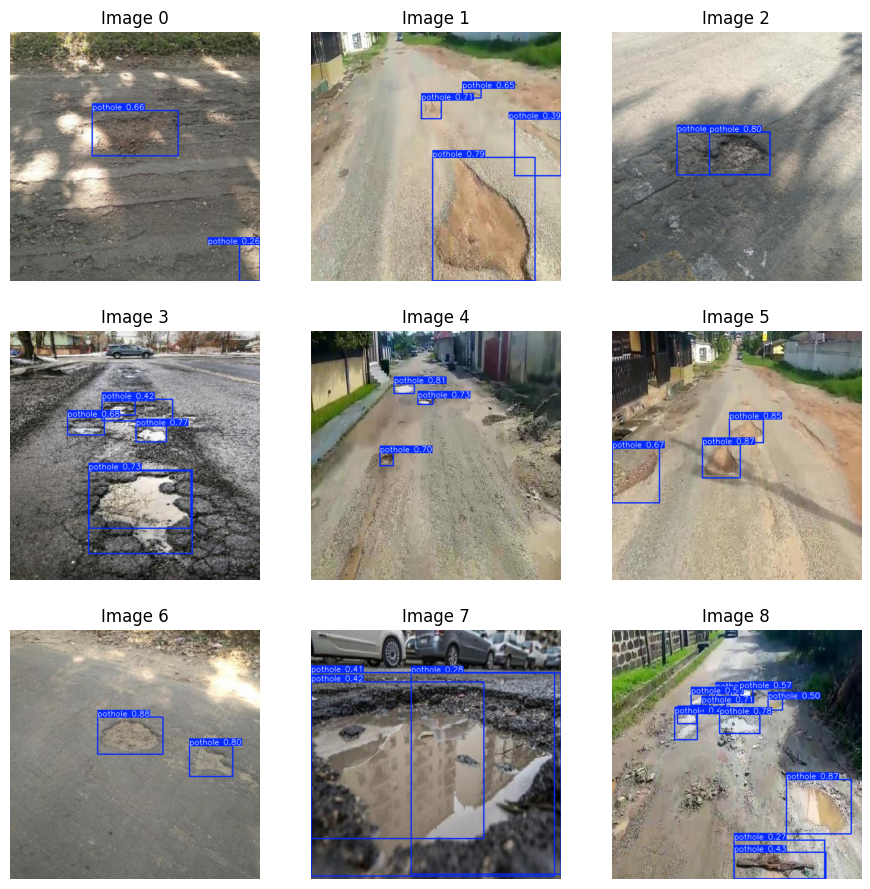

In [ ]:
test_img_dir = '/content/path/PotholeDetection/test/images'
test_images = os.listdir(test_img_dir)
test_img = [os.path.join(test_img_dir, img) for img in test_images[:9]]

test_visualization(test_img)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/path/PotholeDetection.zip

Archive:  /content/drive/MyDrive/path/PotholeDetection.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/021_png_jpg.rf.d23b9dbea2caa2d3f02f24805812f9ec.jpg  
 extracting: test/images/032_png_jpg.rf.c44e6e22e14c08d25b35dd7e452e73cc.jpg  
 extracting: test/images/036_png_jpg.rf.5b64b7916583666c1a7000c1498198c6.jpg  
 extracting: test/images/043_png_jpg.rf.88d7bc90ea0d1d34ca686111d622c0dd.jpg  
 extracting: test/images/047_png_jpg.rf.a3dc88e4c9f6c020d57ed4abd56b666c.jpg  
 extracting: test/images/054_png_jpg.rf.33ac65ecdb75688841deeadf672727f5.jpg  
 extracting: test/images/083_png_jpg.rf.5ac134629195b4e07fd30ec30b712615.jpg  
 extracting: test/images/091_png_jpg.rf.ccf347a8120f15ed8943c99f8d7a7356.jpg  
 extracting: test/images/098_png_jpg.rf.4edd0f9c027d6bf0d2c3afa8f49bc94b.jpg  
 extracting: test/images/107_png_jpg.rf.a480c9ffbdc9c8db9363a6ba7d01029

In [ ]:
!pip install ultralytics
!pip install -U ipywidgets
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.6/801.6 kB 8.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

In [ ]:
train_img_dir = '/content/train/images'
train_images = os.listdir(train_img_dir)

val_img_dir = '/content/valid/images'
val_images = os.listdir(val_img_dir)

train_labels_dir = '/content/train/labels'
val_labels_dir = '/content/valid/labels'

In [ ]:
label_list = ['pothole']

In [ ]:
def label_name(label_class):
    if 0 <= label_class < len(label_list):
        return label_list[label_class]
    else:
        return "none"

def load_labels(images, labels_dir):
    labels = []
    for img in images:
        label_path = os.path.join(labels_dir, img.replace('.jpg', '.txt'))
        try:
            with open(label_path, "r") as file:
                text = file.read().strip()
            if len(text) < 1:
                labels.append('None')
            else:
                labels.append(int(text.split()[0]))
        except FileNotFoundError:
            labels.append('None')
    return labels

train_labels = load_labels(train_images, train_labels_dir)
val_labels = load_labels(val_images, val_labels_dir)

def convert_labels(labels):
    return [int(label) if label != 'None' else -1 for label in labels]

train_labels = convert_labels(train_labels)
val_labels = convert_labels(val_labels)

In [ ]:
df_train = pd.DataFrame({
    'image_path': train_images,
    'label_class': train_labels
})
df_train['label_name'] = df_train['label_class'].apply(label_name)

df_val = pd.DataFrame({
    'image_path': val_images,
    'label_class': val_labels
})
df_val['label_name'] = df_val['label_class'].apply(label_name)


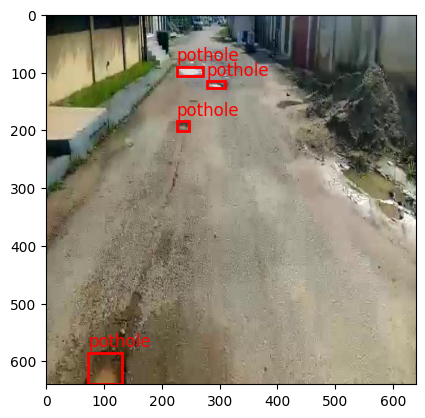

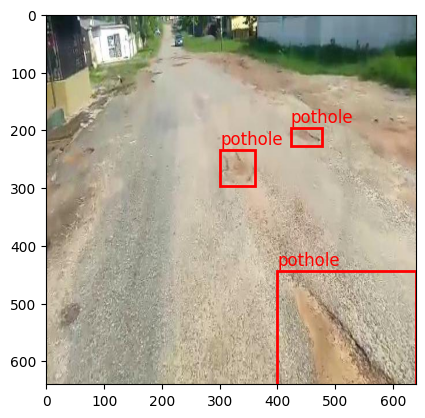

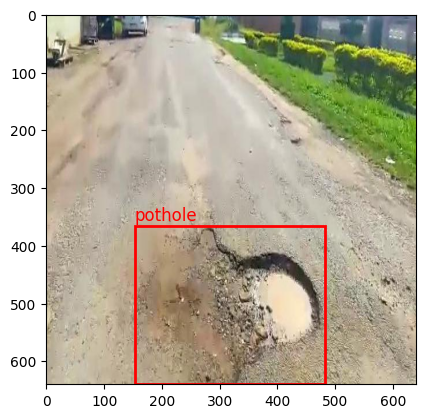

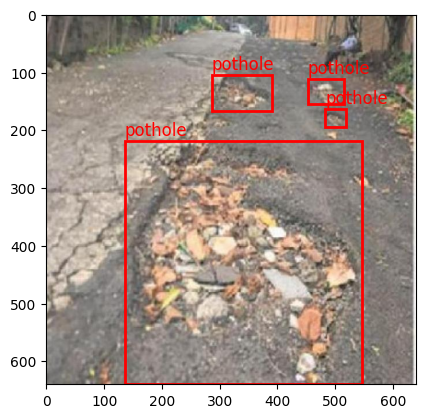

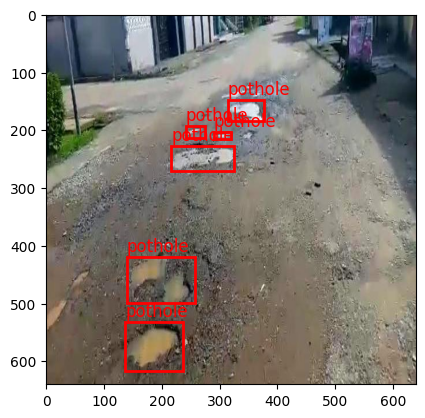

In [ ]:

import matplotlib.patches as patches

def plot_bounding_box(image_path, labels_dir):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label_path = os.path.join(labels_dir, os.path.basename(image_path).replace('.jpg', '.txt'))
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    try:
        with open(label_path, 'r') as file:
            for line in file:
                class_id, x_center, y_center, width, height = map(float, line.split())
                x_center, y_center, width, height = x_center * img.shape[1], y_center * img.shape[0], width * img.shape[1], height * img.shape[0]
                rect = patches.Rectangle((x_center - width / 2, y_center - height / 2), width, height, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                plt.text(x_center - width / 2, y_center - height / 2 - 10, label_name(int(class_id)), color='r', fontsize=12)
    except FileNotFoundError:
        print(f"Label file not found for {image_path}")
    plt.show()


for img_path in df_train['image_path'].sample(5).values:
    plot_bounding_box(os.path.join(train_img_dir, img_path), train_labels_dir)

In [ ]:
from ultralytics import YOLO
import os

# Build a YOLOv9c model from scratch
model = YOLO("yolov9c.yaml")

# Build a YOLOv9c model from pretrained weight
model = YOLO("yolov9c.pt")

# Display model information (optional)
model.info()

# Train the model on the dataset for 20 epochs
model.train(data="/content/data.yaml", epochs=20, imgsz=640, lr0=0.0001, dropout=0.15)

# Path to save the model weights
save_path = '/content/yolov9c_best.pt'

# Save the model weights
model.save(save_path)


YOLOv9c summary: 618 layers, 25,590,912 parameters, 0 gradients, 104.0 GFLOPs
Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=/content/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, s

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.25M/6.25M [00:00<00:00, 110MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/train/labels... 943 images, 0 backgrounds, 0 corrupt: 100%|██████████| 943/943 [00:01<00:00, 556.48it/s]

train: New cache created: /content/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/valid/labels... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<00:00, 508.99it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      11.1G      1.768      2.288      1.653         70        640: 100%|██████████| 59/59 [00:50<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]

                   all        269        988     0.0779      0.252     0.0529     0.0227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      11.3G      1.779      1.694      1.661         67        640: 100%|██████████| 59/59 [00:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]

                   all        269        988      0.022     0.0243       0.01    0.00215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      11.2G      1.736      1.634      1.613         96        640: 100%|██████████| 59/59 [00:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.42it/s]

                   all        269        988      0.237      0.317       0.19      0.086



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      11.4G      1.733       1.54      1.605        116        640: 100%|██████████| 59/59 [00:45<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.41it/s]

                   all        269        988     0.0658      0.311     0.0448      0.019



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      11.2G      1.665       1.46      1.587        108        640: 100%|██████████| 59/59 [00:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.39it/s]

                   all        269        988      0.453      0.516      0.465      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      11.3G       1.62      1.387      1.542         85        640: 100%|██████████| 59/59 [00:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]

                   all        269        988      0.548      0.636      0.579      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      11.3G      1.589       1.31      1.508         79        640: 100%|██████████| 59/59 [00:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]

                   all        269        988      0.702       0.65      0.699      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      11.2G      1.546      1.287      1.494         60        640: 100%|██████████| 59/59 [00:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]

                   all        269        988      0.683      0.632      0.685      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      11.2G      1.521      1.237      1.463        123        640: 100%|██████████| 59/59 [00:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]

                   all        269        988      0.582      0.538      0.562      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      11.4G      1.524      1.212      1.465         51        640: 100%|██████████| 59/59 [00:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.42it/s]

                   all        269        988      0.724      0.722      0.776      0.437


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      11.2G       1.46      1.115      1.434         60        640: 100%|██████████| 59/59 [00:48<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.63it/s]

                   all        269        988      0.768      0.729        0.8      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      11.4G      1.425      1.079      1.435         33        640: 100%|██████████| 59/59 [00:45<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.57it/s]

                   all        269        988      0.754      0.733      0.803      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      11.3G      1.434      1.047      1.425         89        640: 100%|██████████| 59/59 [00:45<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.41it/s]

                   all        269        988      0.813       0.74       0.82       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      11.2G      1.396      1.003      1.402         59        640: 100%|██████████| 59/59 [00:45<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]

                   all        269        988        0.8      0.717      0.825       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      11.3G      1.388     0.9761      1.399         55        640: 100%|██████████| 59/59 [00:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]

                   all        269        988      0.785      0.779      0.839      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      11.4G      1.343     0.9095       1.36         62        640: 100%|██████████| 59/59 [00:45<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.40it/s]

                   all        269        988      0.798      0.803      0.857      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      11.2G      1.312     0.8716      1.347         48        640: 100%|██████████| 59/59 [00:45<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.47it/s]

                   all        269        988      0.823      0.776      0.861      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      11.2G      1.284     0.8513      1.317         46        640: 100%|██████████| 59/59 [00:45<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.47it/s]

                   all        269        988      0.829      0.775      0.849       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      11.3G      1.261     0.8181      1.313         43        640: 100%|██████████| 59/59 [00:45<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]

                   all        269        988      0.844      0.797      0.877      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      11.2G      1.221     0.7776      1.283         55        640: 100%|██████████| 59/59 [00:45<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]

                   all        269        988      0.826      0.816      0.878      0.557



20 epochs completed in 0.312 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 51.6MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25,320,019 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.06s/it]


                   all        269        988      0.825      0.809      0.878      0.557
Speed: 0.4ms preprocess, 15.6ms inference, 0.1ms loss, 5.1ms postprocess per image
Results saved to runs/detect/train2


lr/pg0,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg1,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg2,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
metrics/mAP50(B),▁▁▂▁▅▆▇▆▅▇▇▇████████
metrics/mAP50-95(B),▁▁▂▁▄▅▆▅▄▆▆▇▇▇▇█████
metrics/precision(B),▁▁▃▁▅▅▇▇▆▇▇▇██▇█████
metrics/recall(B),▃▁▄▄▅▆▇▆▆▇▇▇▇▇██████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,██▇▇▇▆▆▅▅▅▄▄▄▃▃▃▂▂▁▁


In [ ]:
trained_weights = "/content/runs/detect/train2/weights/best.pt"
model = YOLO(trained_weights)

# Evaluate the model on the validation set
results = model.val(data = '/content/data.yaml')

# Print the evaluation metrics
# Accessing metrics using the appropriate methods
precision = results.box.mp # Mean precision
recall = results.box.mr    # Mean recall
mAP50 = results.box.map50  # mAP@0.5
mAP50_95 = results.box.map  # mAP@0.5:0.95

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"mAP@0.5: {mAP50}")
print(f"mAP@0.5:0.95: {mAP50_95}")


Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25,320,019 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/valid/labels.cache... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:13<00:00,  1.24it/s]


                   all        269        988      0.825      0.815      0.878      0.556
Speed: 0.4ms preprocess, 31.0ms inference, 0.0ms loss, 4.7ms postprocess per image
Results saved to runs/detect/val
Precision: 0.8247667649392512
Recall: 0.8147773279352226
mAP@0.5: 0.8775196210975764
mAP@0.5:0.95: 0.5561553752052546


In [ ]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [ ]:
trained_weights = "/content/runs/detect/train2/weights/best.pt"
model = YOLO(trained_weights)

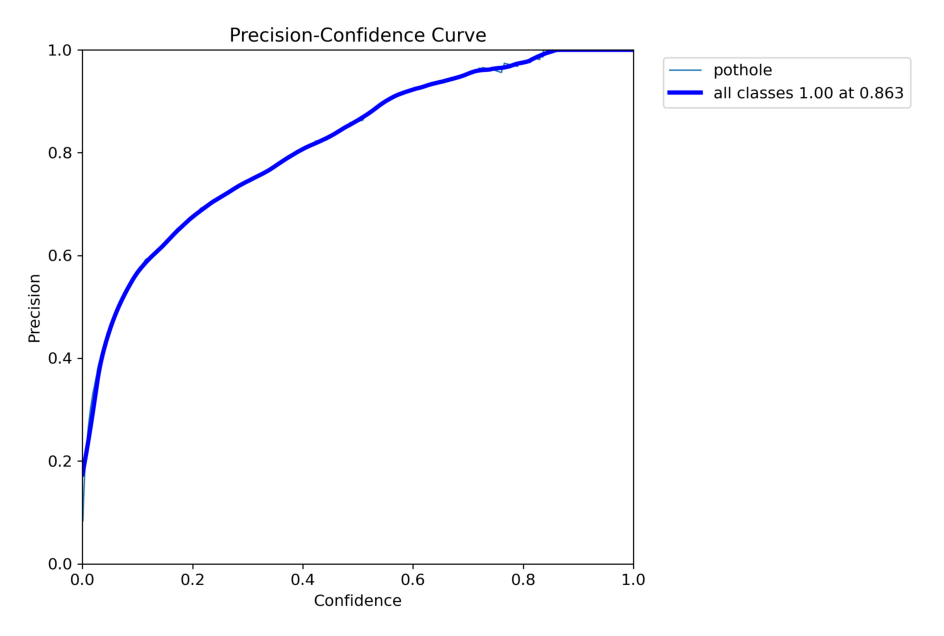

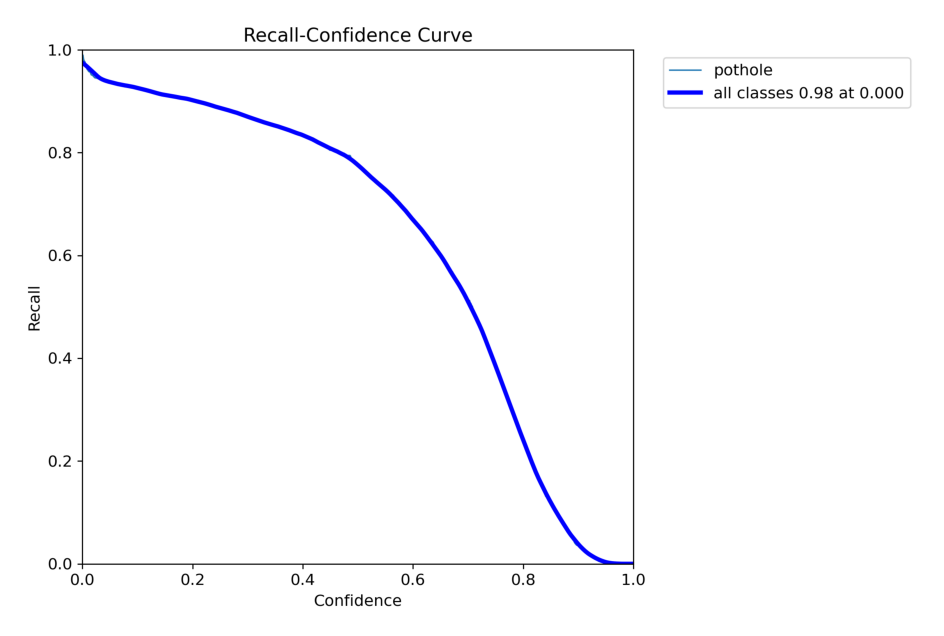

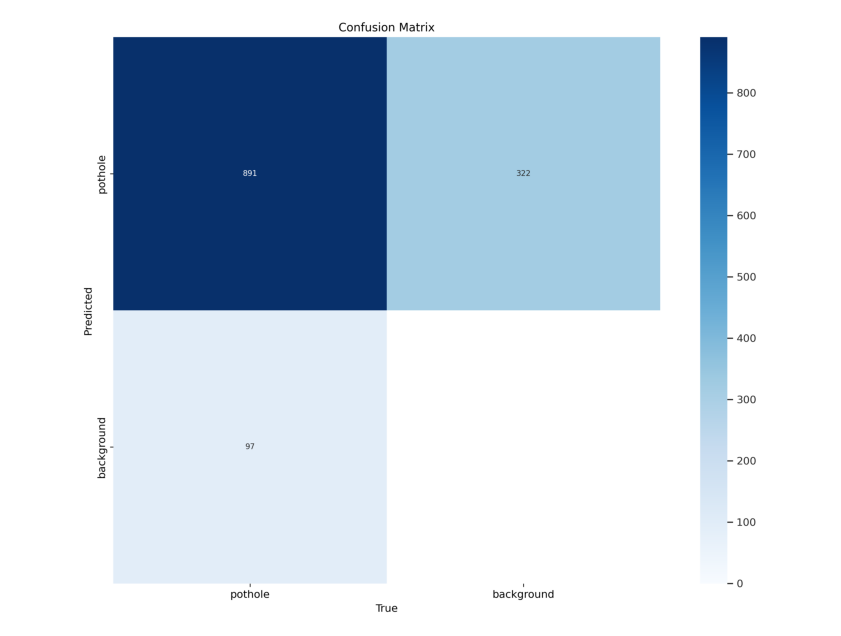

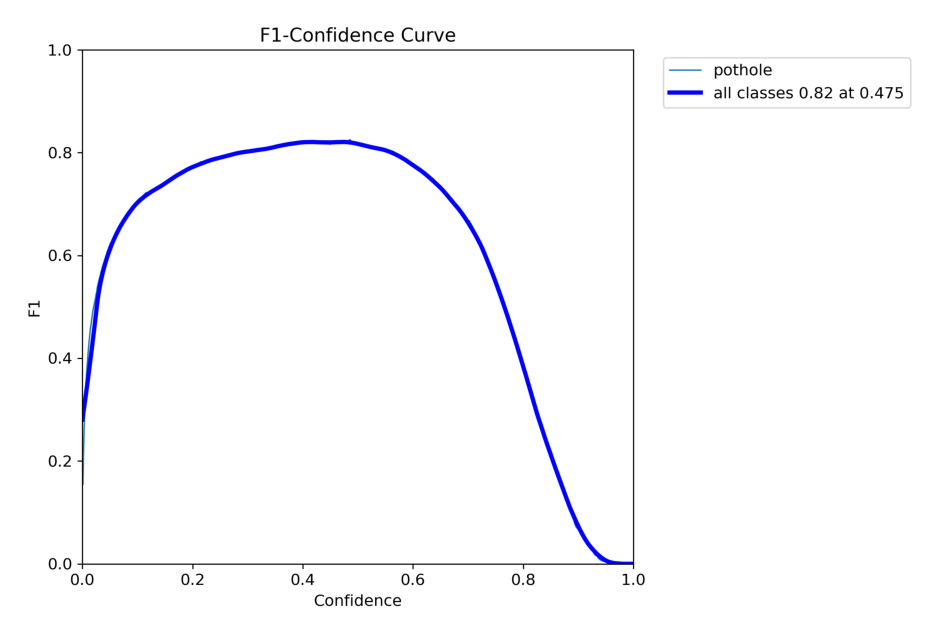

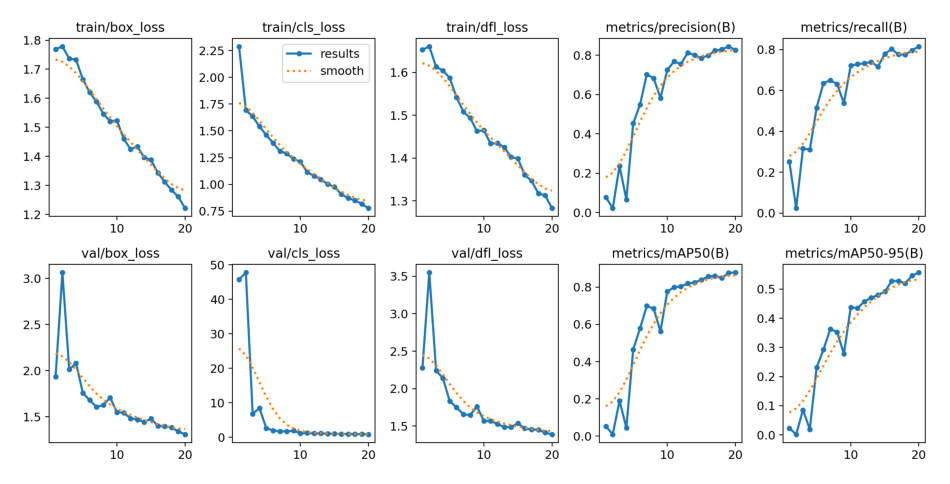

In [ ]:
list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png", "F1_curve.png", "results.png"]

for metric in list_of_metrics:
    image = Image.open(f'/content/runs/detect/train2/{metric}')
    plt.figure(figsize=(12, 8))
    plt.axis("off")
    plt.imshow(image)
    plt.show()


In [ ]:
def test_visualization(images):
    output = model.predict(images)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(images):
        ax = axes[i // 3, i % 3]
        im_bgr = cv2.imread(r)
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(output):
        ax = axes[i // 3, i % 3]
        im_bgr = r.plot()  # BGR-order numpy array
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)


0: 640x640 7 potholes, 35.4ms
1: 640x640 4 potholes, 35.4ms
2: 640x640 1 pothole, 35.4ms
3: 640x640 8 potholes, 35.4ms
4: 640x640 3 potholes, 35.4ms
5: 640x640 13 potholes, 35.4ms
6: 640x640 2 potholes, 35.4ms
7: 640x640 2 potholes, 35.4ms
8: 640x640 3 potholes, 35.4ms
Speed: 1.9ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


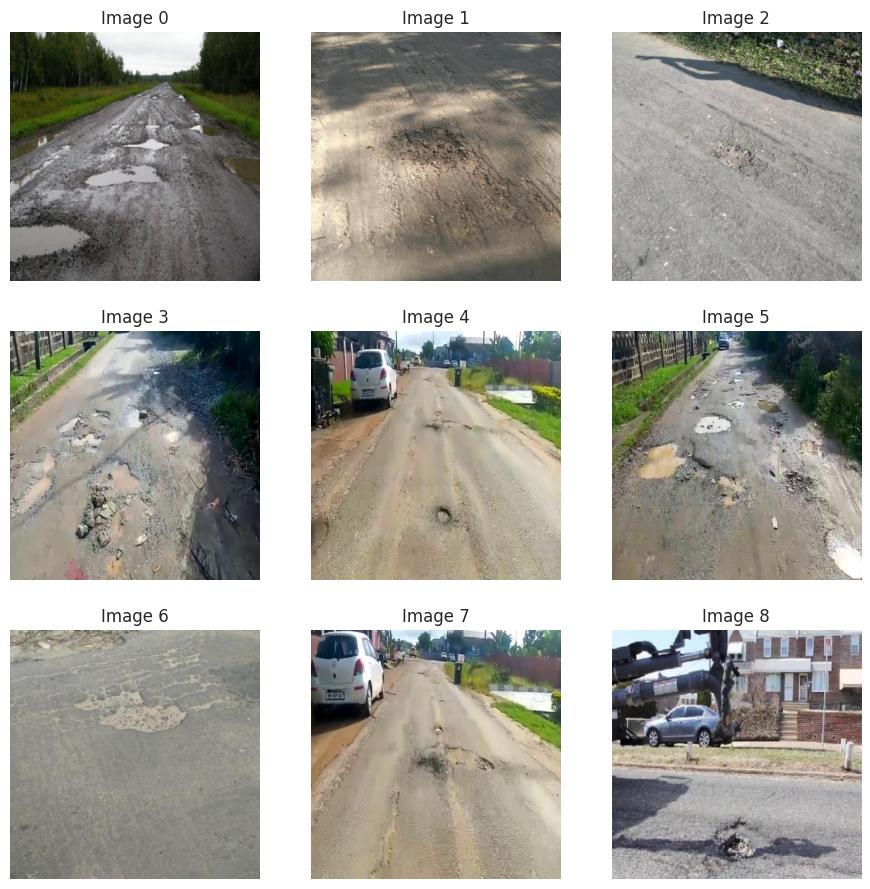

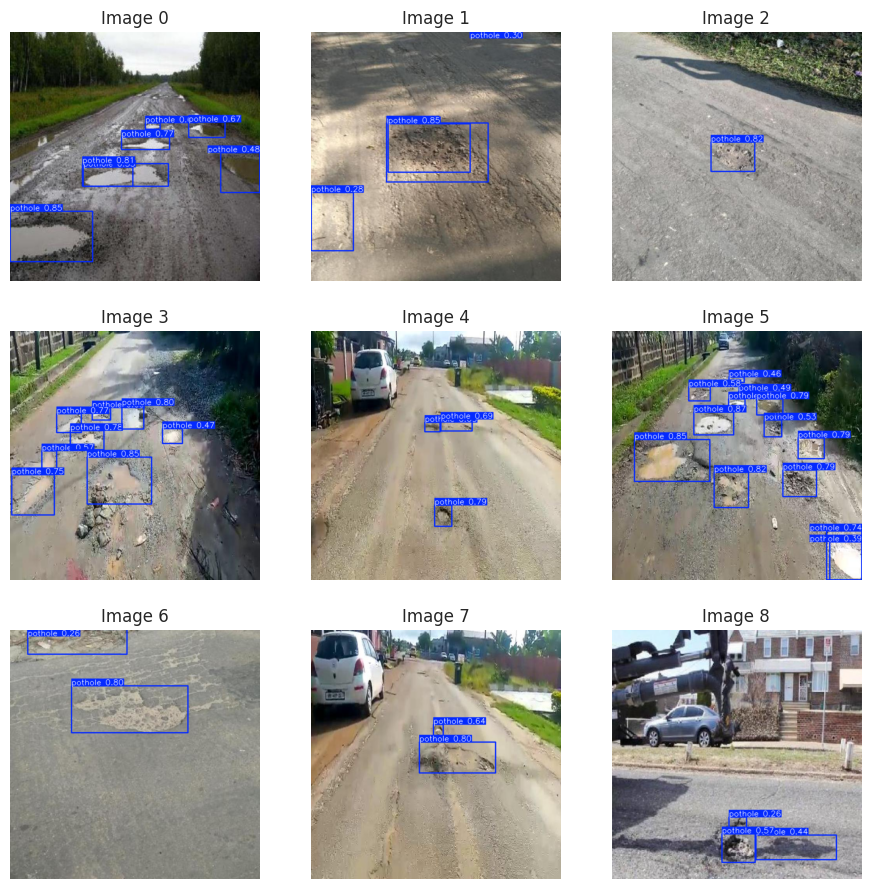

In [ ]:
test_img_dir = '/content/test/images'
test_images = os.listdir(test_img_dir)
test_img = [os.path.join(test_img_dir, img) for img in test_images[:9]]

test_visualization(test_img)

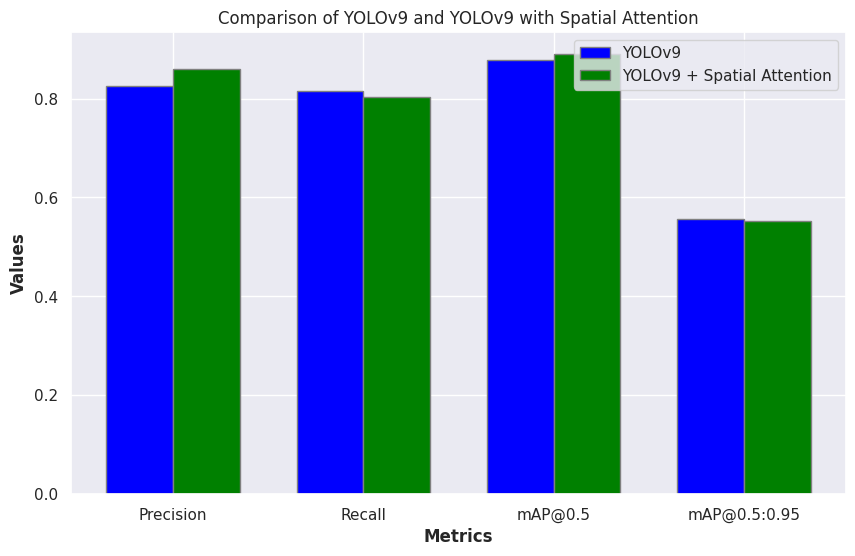

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Metrics for YOLOv9
yolo_v9_metrics = {
    'Precision': 0.8247667649392512,
    'Recall': 0.8147773279352226,
    'mAP@0.5': 0.8775196210975764,
    'mAP@0.5:0.95': 0.5561553752052546
}

# Metrics for YOLOv9 with Spatial Attention
yolo_v9_sa_metrics = {
    'Precision': 0.8602540244168622,
    'Recall': 0.8037485895236616,
    'mAP@0.5': 0.8899101357684223,
    'mAP@0.5:0.95': 0.5523345060572618
}

# Names of the metrics
metrics = list(yolo_v9_metrics.keys())

# Values of the metrics
yolo_v9_values = list(yolo_v9_metrics.values())
yolo_v9_sa_values = list(yolo_v9_sa_metrics.values())

# Bar width
bar_width = 0.35

# Positions of the bars on the x-axis
r1 = np.arange(len(metrics))
r2 = [x + bar_width for x in r1]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot bars
plt.bar(r1, yolo_v9_values, color='blue', width=bar_width, edgecolor='grey', label='YOLOv9')
plt.bar(r2, yolo_v9_sa_values, color='green', width=bar_width, edgecolor='grey', label='YOLOv9 + Spatial Attention')

# Add labels
plt.xlabel('Metrics', fontweight='bold')
plt.ylabel('Values', fontweight='bold')
plt.title('Comparison of YOLOv9 and YOLOv9 with Spatial Attention')
plt.xticks([r + bar_width / 2 for r in range(len(metrics))], metrics)

# Add legend
plt.legend()

# Display the plot
plt.show()
